<a href="https://colab.research.google.com/github/PLEX-GR00T/2D_ObjDetection_Roboflow/blob/main/Detectron2_Roboflow_Final_V2_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 23 kB/s 
     |████████████████████████████████| 6.6 MB 30.4 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Successfully uninstalled torchvision-0.11.1+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
     |████████████████████████████████| 274 kB 5.2 MB/s 
  Created wheel fo

In [2]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2 MB 811 kB/s 
     |████████████████████████████████| 49 kB 2.4 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20211023-py3-none-any.whl size=60947 sha256=0fd6198b207fcaee80d2e09e8aa5556c98222c561b5ecdb2a82f01bb0c47f585
  Stored in directory: /root/.cache/pip/wheels/16/98/fc/252d62cab6263c719120e06b28f3378af59b52ce7a20e81852
Successfully built fvcore


In [3]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [4]:
!curl -L "https://app.roboflow.com/ds/h9sv7pSXU7?key=UxKOPjM6Pu" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   888  100   888    0     0   1724      0 --:--:-- --:--:-- --:--:--  1720
100  261M  100  261M    0     0  97.3M      0  0:00:02  0:00:02 --:--:--  141M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/000012_jpg.rf.3fe83c3315ea8afd19ca035531a01e91.jpg  
 extracting: test/000015_jpg.rf.beb65168908103c26c78ebe7d02b6eae.jpg  
 extracting: test/000021_jpg.rf.c6c2218f5caaca85fddf6a727f5768f4.jpg  
 extracting: test/000025_jpg.rf.3330a544528dafd7703b7a2272c2adb5.jpg  
 extracting: test/000026_jpg.rf.d459e2523253e5f87e826c55fb71cd1f.jpg  
 extracting: test/00003_jpg.rf.ccb66ce26658a3e3830c8349f0b180cd.jpg  
 extracting: test/000046_jpg.rf.615278c918fad4a604886c4358e5b815.jpg  
 extracting: test/000068_jpg.rf.9172a93fda58e36d7ca4521d7070190e.jpg  

In [5]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")

WARNING [12/15 09:24:00 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/15 09:24:00 d2.data.datasets.coco]: Loaded 2188 images in COCO format from /content/train/_annotations.coco.json


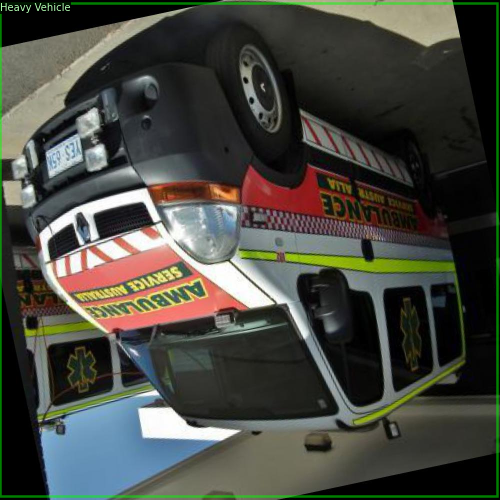

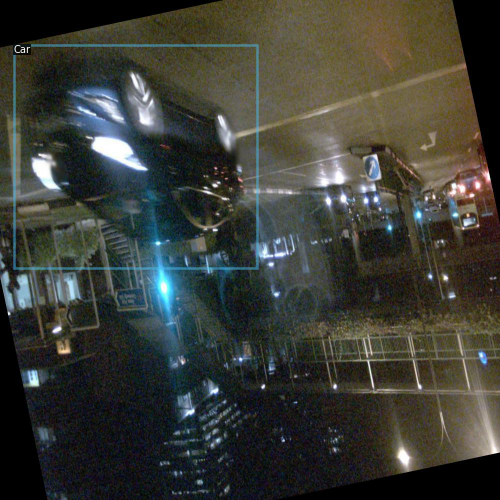

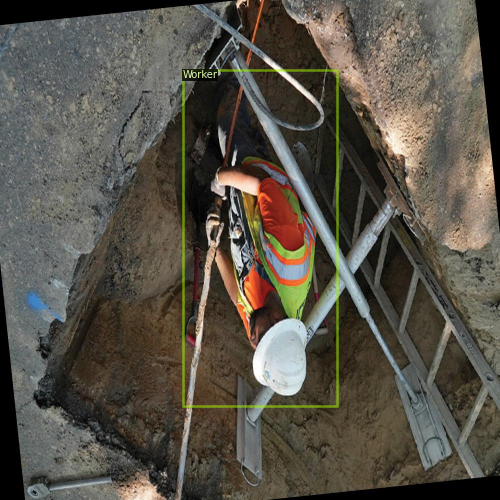

In [6]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [7]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [8]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/15 09:24:08 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:12, 34.9MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_p

[12/15 09:24:28 d2.engine.train_loop]: Starting training from iteration 0
[12/15 09:26:11 d2.utils.events]:  eta: 2:14:22  iter: 19  total_loss: 2.497  loss_cls: 1.575  loss_box_reg: 0.840  loss_rpn_cls: 0.042  loss_rpn_loc: 0.021  time: 5.2009  data_time: 0.0363  lr: 0.000020  max_mem: 7201M
[12/15 09:27:56 d2.utils.events]:  eta: 2:12:29  iter: 39  total_loss: 2.249  loss_cls: 1.335  loss_box_reg: 0.877  loss_rpn_cls: 0.048  loss_rpn_loc: 0.021  time: 5.2178  data_time: 0.0175  lr: 0.000040  max_mem: 7201M
[12/15 09:29:40 d2.utils.events]:  eta: 2:10:39  iter: 59  total_loss: 1.881  loss_cls: 0.947  loss_box_reg: 0.877  loss_rpn_cls: 0.038  loss_rpn_loc: 0.015  time: 5.2181  data_time: 0.0179  lr: 0.000060  max_mem: 7201M
[12/15 09:31:26 d2.utils.events]:  eta: 2:08:51  iter: 79  total_loss: 1.711  loss_cls: 0.743  loss_box_reg: 0.903  loss_rpn_cls: 0.034  loss_rpn_loc: 0.020  time: 5.2388  data_time: 0.0182  lr: 0.000080  max_mem: 7201M
[12/15 09:33:09 d2.utils.events]:  eta: 2:07:0

In [9]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [10]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [12/15 11:40:13 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/15 11:40:13 d2.data.datasets.coco]: Loaded 112 images in COCO format from /content/test/_annotations.coco.json
[12/15 11:40:13 d2.data.build]: Distribution of instances among all 5 categories:
|  category  | #instances   |  category  | #instances   |   category    | #instances   |
|:----------:|:-------------|:----------:|:-------------|:-------------:|:-------------|
|    Cars    | 0            |    Car     | 159          | Heavy Vehicle | 47           |
|   Worker   | 56           | pedestrian | 64           |               |              |
|   total    | 326          |            |              |               |              |
[12/15 11:40:13 d2.data.common]: Serializing 112 elements to byte tensors and concatenating them all ...
[12/15 11:40:13 d2.data.common]: Serialized dataset takes 0.04 MiB
[12/15 11:40:13 d2.evaluation.evaluator]: Start 

OrderedDict([('bbox',
              {'AP': 36.3313637266954,
               'AP-Car': 51.371729104366814,
               'AP-Cars': nan,
               'AP-Heavy Vehicle': 50.202691076281035,
               'AP-Worker': 43.751034726133746,
               'AP-pedestrian': 0.0,
               'AP50': 63.91217369158391,
               'AP75': 39.55347651016284,
               'APl': 38.20145903629913,
               'APm': 25.208927775468737,
               'APs': 15.0})])

In [11]:
%ls ./output/

coco_instances_results.json                       last_checkpoint
events.out.tfevents.1639560255.eacf5b724adc.71.0  metrics.json
instances_predictions.pth                         model_final.pth


In [12]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

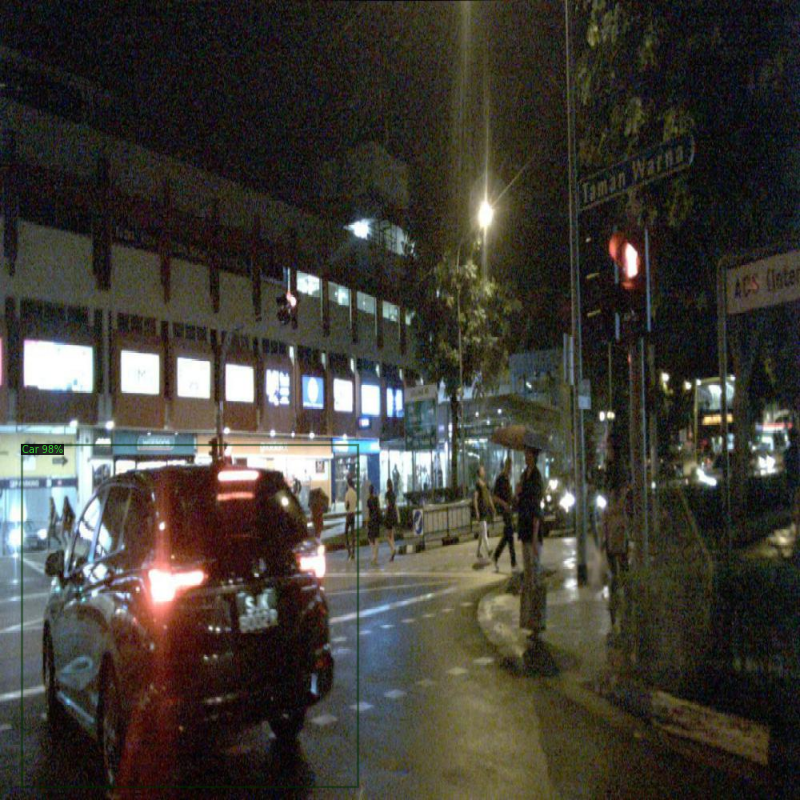

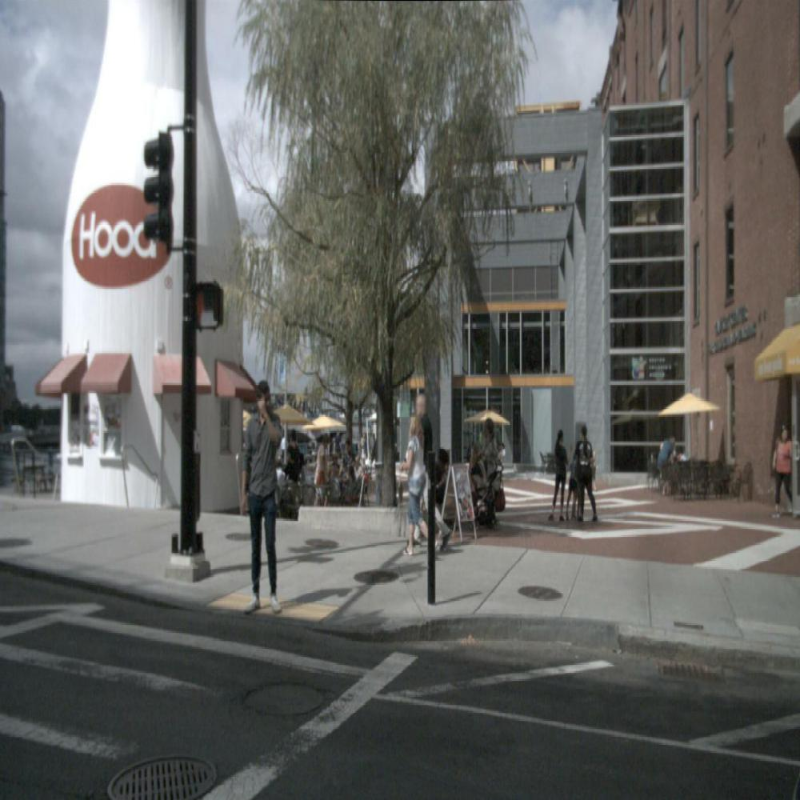

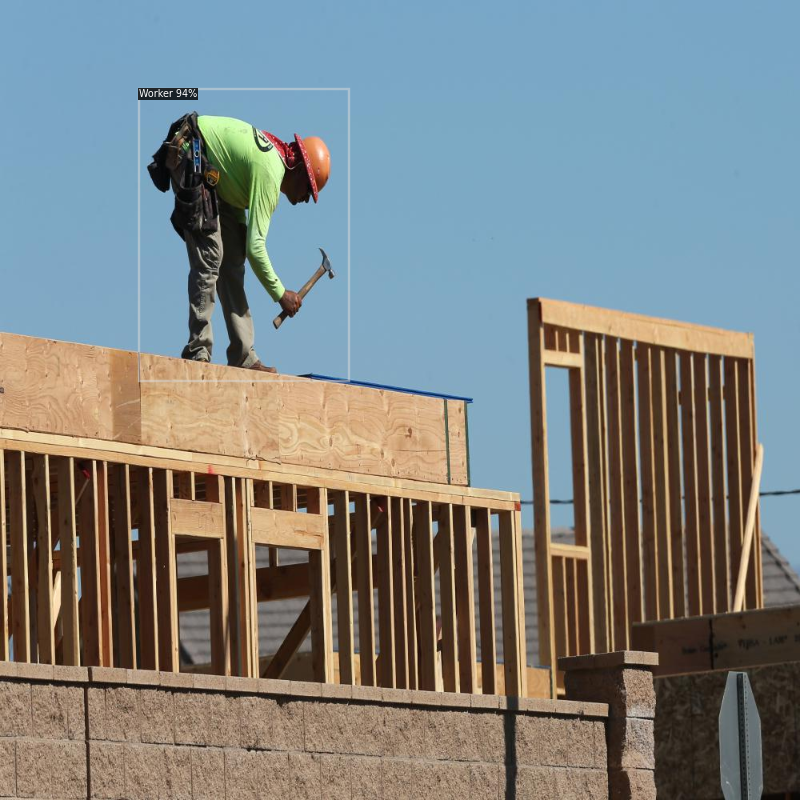

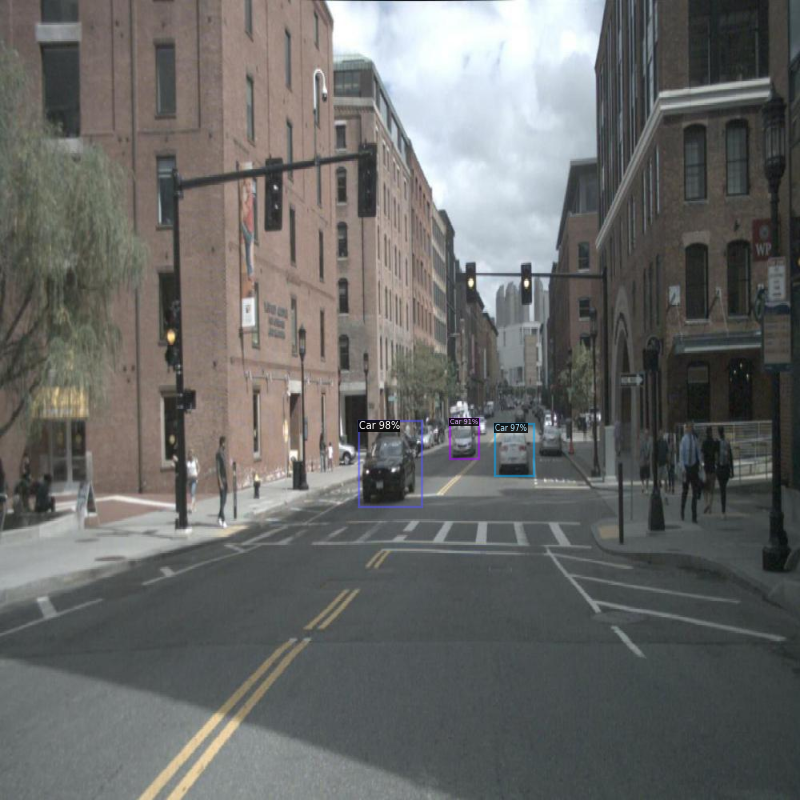

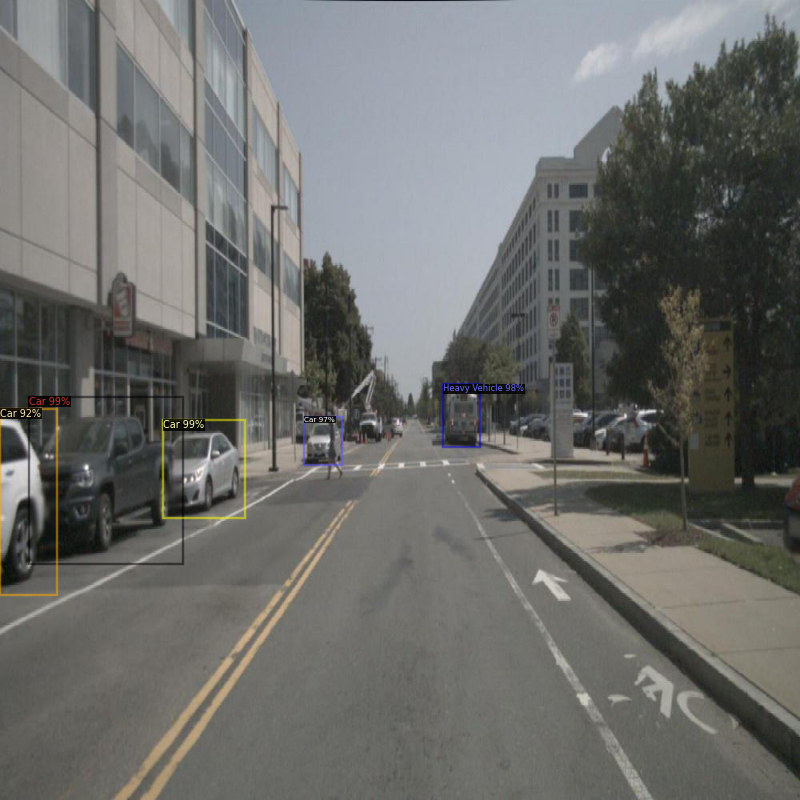

...

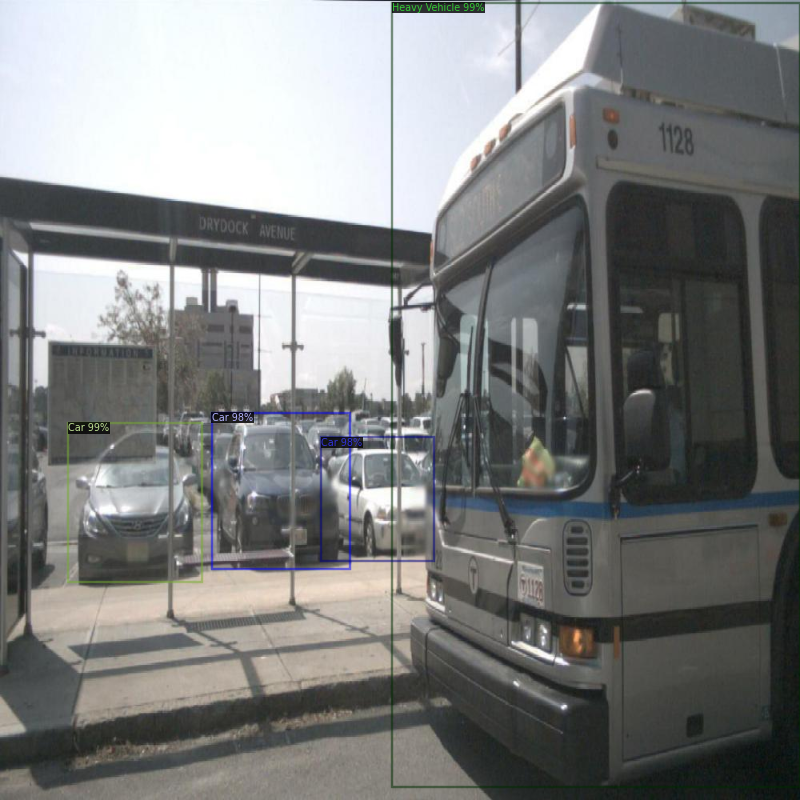

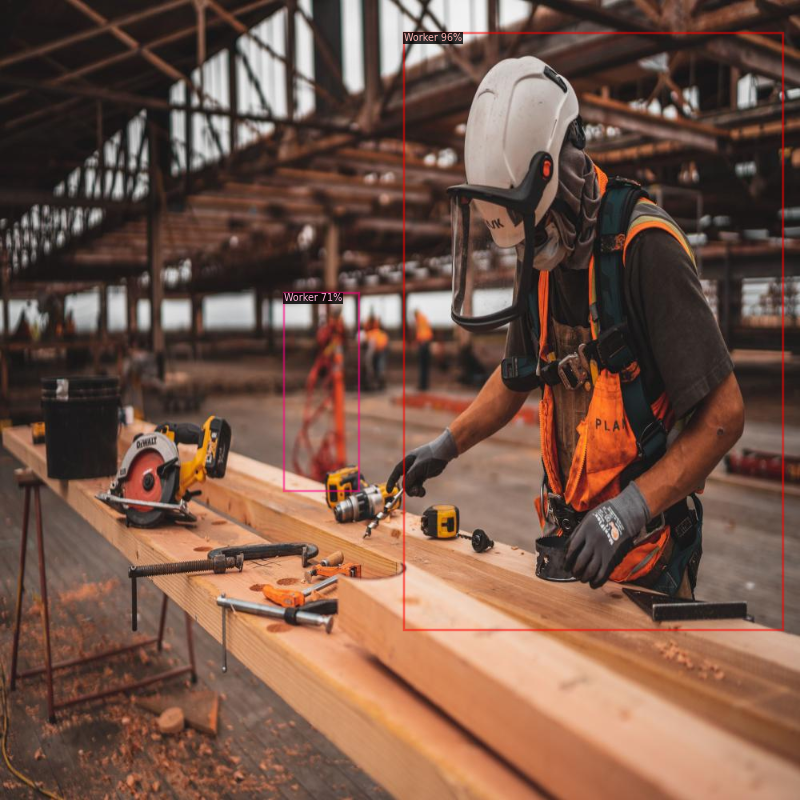

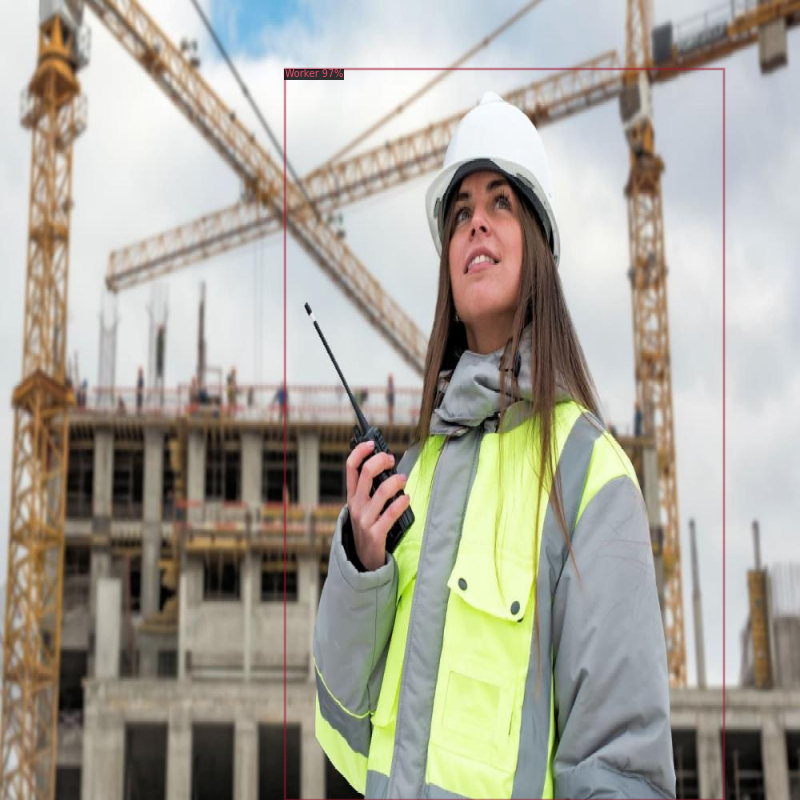

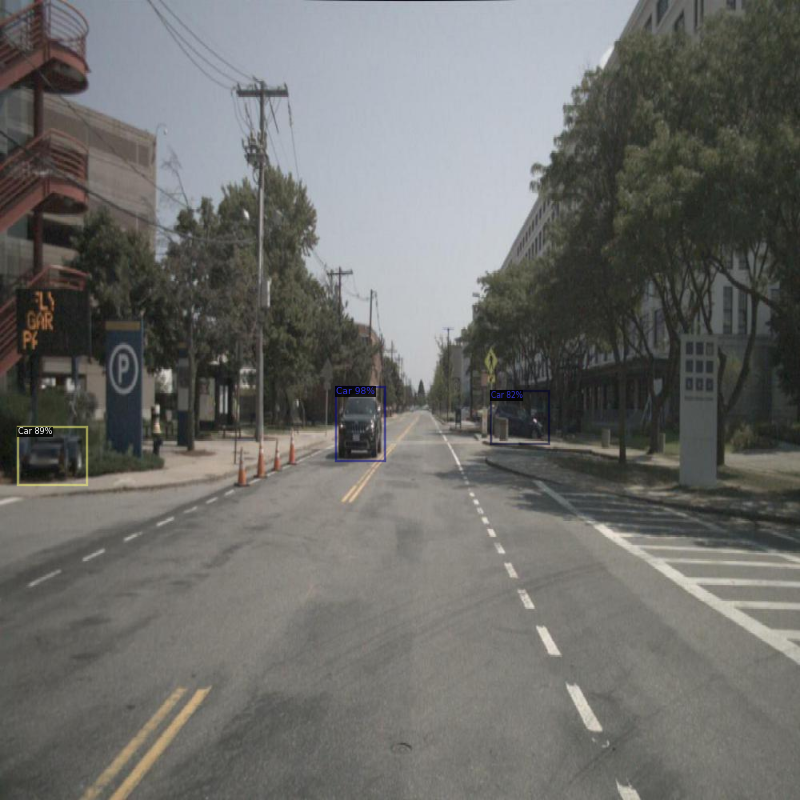

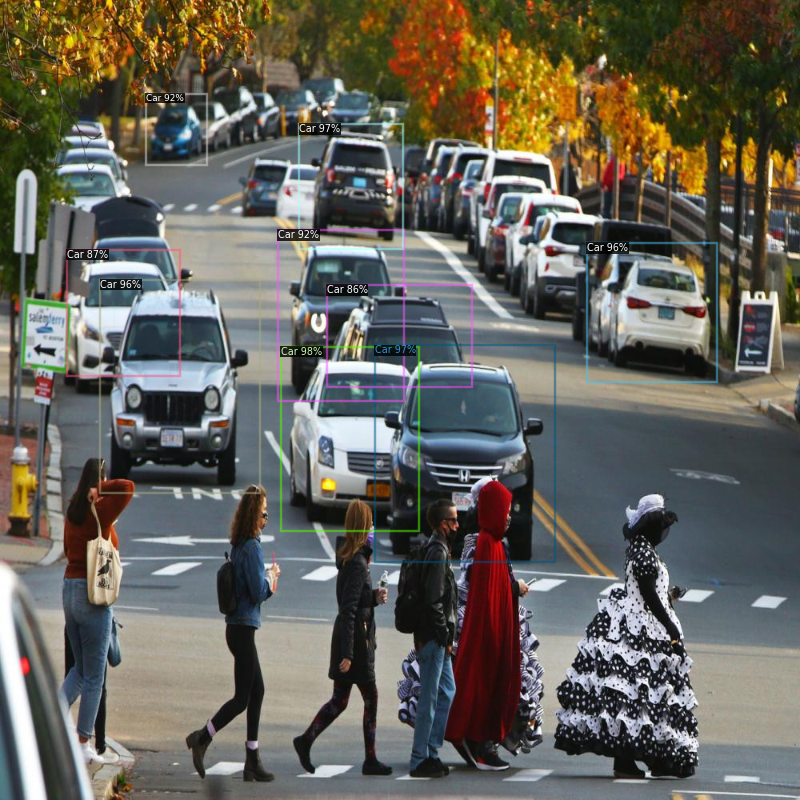

In [19]:
from detectron2.utils.visualizer import ColorMode
import glob
countIdx = 0
for imageName in glob.glob('/content/test/*jpg'):
  countIdx = countIdx + 1
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2.imwrite('/content/outputs/frame%d.jpg' % countIdx, out.get_image()[:, :, ::-1])
  if countIdx%10 == 1:
    cv2_imshow(out.get_image()[:, :, ::-1])
